# Imports and options

In [1]:
!which python

In [2]:
%load_ext autoreload
%autoreload 2

In [3]:
from cicada.utils import data
from cicada.utils import models
from cicada.utils import plans
from cicada.utils import visualisation as viz
from cicada import training
from cicada import agent

In [4]:
from kaggle_environments.envs.football.helpers import human_readable_agent
from kaggle_environments import make

In [5]:
import numpy as np
import pandas as pd
from ipywidgets import interact
from copy import deepcopy
from tqdm.notebook import tqdm
import seaborn as sns
import json
import matplotlib.pyplot as plt
import statsmodels.api as sm

In [6]:
import lightgbm as lgb
from lightgbm import LGBMClassifier, LGBMRegressor
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import RidgeCV, RidgeClassifierCV
from sklearn.preprocessing import RobustScaler, PolynomialFeatures
from sklearn.pipeline import make_pipeline
import joblib
import shap

In [7]:
pd.options.display.max_columns = 999
pd.options.display.max_rows = 999

# Single game with diagnostics

In [8]:
agent.plans.models.load_lgb_models()
agent_obj = agent.Agent(noise_sd=0)

env = make("football", configuration={
    "save_video": True, 
    "scenario_name": "11_vs_11_kaggle",
    "running_in_notebook": True,
})

trainer = env.train([None, "cicada/simple_rules_based_agent.py"])

obs = trainer.reset()
while not env.done:
    action = agent_obj.action_wrapper(obs)
    obs, reward, done, info = trainer.step(action)

env.render(mode="human", width=800, height=600)

breakaway decision point at step 162
breakaway decision point at step 163
breakaway decision point at step 1637
breakaway decision point at step 1638
breakaway decision point at step 2390
breakaway decision point at step 2391
breakaway decision point at step 2617
breakaway decision point at step 2618
breakaway decision point at step 2952


In [9]:
fig = viz.make_figure_widget(25)

In [10]:
@interact(view_step=(0, len(env.steps) - 2))
def interactive_display(view_step=0):
    step = deepcopy(env.steps[view_step])
    log_step = agent_obj.state.log[view_step]
    state = data.State(data.step_to_obs(step))
    fig.update(data=viz.get_traces(state, log_step))
    viz.print_diagnostics(state, log_step)
fig

interactive(children=(IntSlider(value=0, description='view_step', max=3000), Output()), _dom_classes=('widget-…

FigureWidget({
    'data': [{'hoverinfo': 'text',
              'marker': {'color': 'darkorange',
            …

# Many games

- 2020-11-03: trial for lgbm vs. linear for move/pass models, 100 games each, started at 4110
    - lgbm was better
- 2020-11-04: trial for breakaway vs. no breakaway, 100 games each, started at 5510
    - breakaway was better
- 2020-11-04: trial for ridge vs. lgbm for move/pass, 100 games each, started at 5710
    - lgbm very slightly
- 2020-11-04: trial for risk aversion 1.0 vs 1.5, 100 games each, started at 5810
    - 1.5 was much worse

In [11]:
scores = data.get_score_file_as_df()
scores["loss"] = 1 - scores.win - scores.tie
scores.shape

(23316, 5)

In [12]:
(scores.left_score + scores.right_score > 0).sum()

21641

<AxesSubplot:title={'center':'right_score'}>

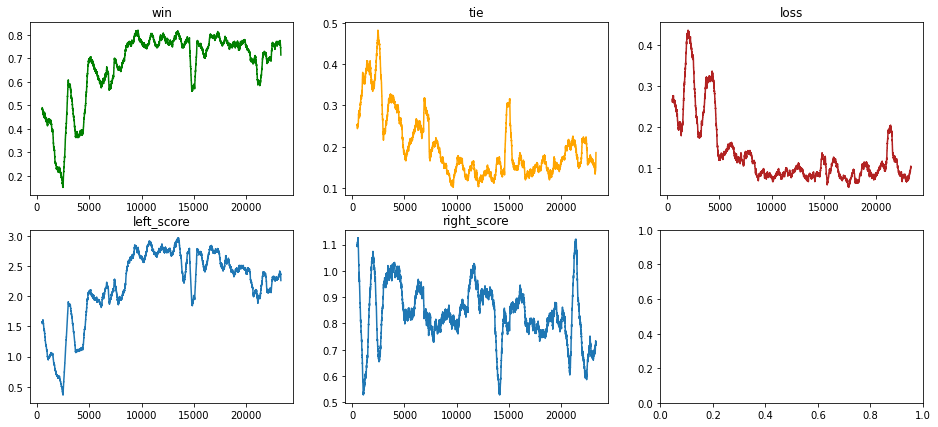

In [13]:
n_start = 0
grp_size = 500

tmp = scores.iloc[n_start:]
su = tmp.rolling(grp_size).mean()

f, axes = plt.subplots(2, 3, figsize=(16, 7))
su.win.plot(ax=axes[0][0], title="win", color="green")
su.tie.plot(ax=axes[0][1], title="tie", color="orange")
su.loss.plot(ax=axes[0][2], title="loss", color="firebrick")
su.left_score.plot(ax=axes[1][0], title="left_score")
su.right_score.plot(ax=axes[1][1], title="right_score")

## Shot data

In [14]:
shots = models.make_shot_dataset(incremental=False)
for col in models.lgb_model_specs["shot_success"]["features"].values():
    shots[col] = shots[col].astype("float32")
shots.shape

100%|██████████| 23316/23316 [05:41<00:00, 68.28it/s] 


dropping column eval_data.dist_to_goalie because all values are nan


(86084, 14)

In [15]:
shots.head()

,type,step,queued_at,eval_data.pos,eval_data.view_of_net,eval_data.distance_to_net,eval_data.prb_success,eval_data.step,target,posx,posy,game_id,one_time_kick,eval_data.shooter_kopp
0,SHOT_ATTEMPT,785,782.0,"[0.9353, -0.0252]",1.252309,0.069428,-1.0,782.0,0,0.9353,-0.0252,1,NaN,NaN
1,SHOT_ATTEMPT,2279,2275.0,"[0.739, -0.1597]",0.312469,0.306027,-1.0,2275.0,0,0.7390,-0.1597,4,NaN,NaN
2,SHOT_ATTEMPT,778,776.0,"[0.9301, -0.0105]",1.162865,0.070702,-1.0,776.0,0,0.9301,-0.0105,7,NaN,NaN
3,SHOT_ATTEMPT,1318,1310.0,"[0.8444, -0.1254]",0.440408,0.199800,-1.0,1310.0,0,0.8444,-0.1254,7,NaN,NaN
4,SHOT_ATTEMPT,1350,1345.0,"[0.9247, -0.0393]",0.331737,0.084952,-1.0,1345.0,0,0.9247,-0.0393,7,NaN,NaN


In [16]:
shots.describe()

,step,queued_at,eval_data.view_of_net,eval_data.distance_to_net,eval_data.prb_success,eval_data.step,target,posx,posy,game_id,eval_data.shooter_kopp
count,86084.0000,64218.000000,86084.000000,86084.000000,86084.000000,28136.000000,86084.000000,86084.000000,86084.000000,86084.000000,21866.000000
mean,1515.2998,1512.755069,0.335537,0.244611,0.016174,1536.662212,0.124820,0.793012,0.005593,13645.044724,99.534904
std,846.6398,845.251182,0.431370,0.220661,0.354743,834.106381,0.330517,0.225118,0.122362,6530.683144,46.866268
min,18.0000,61.000000,0.000000,0.000448,-1.000000,62.000000,0.000000,-1.013600,-0.441500,1.000000,19.885708
25%,777.0000,776.000000,0.168856,0.136031,0.094635,812.750000,0.000000,0.757400,-0.089000,7903.000000,61.281742
50%,1483.0000,1480.000000,0.243201,0.209836,0.126330,1576.000000,0.000000,0.833200,0.005500,13767.500000,88.162880
75%,2251.0000,2245.000000,0.347860,0.270695,0.146118,2257.000000,0.000000,0.907700,0.102200,20020.000000,134.630234
max,3000.0000,2999.000000,3.997500,2.051900,0.787155,2999.000000,1.000000,1.120800,0.452200,23295.000000,429.126648


In [17]:
shots.target.value_counts()

0    75339
1    10745
Name: target, dtype: int64

<AxesSubplot:xlabel='game_id'>

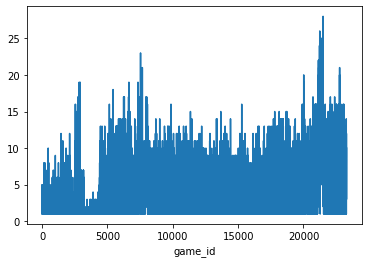

In [18]:
shots.groupby("game_id").size().plot()

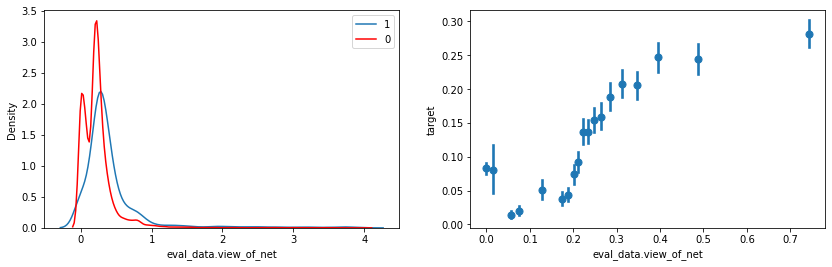

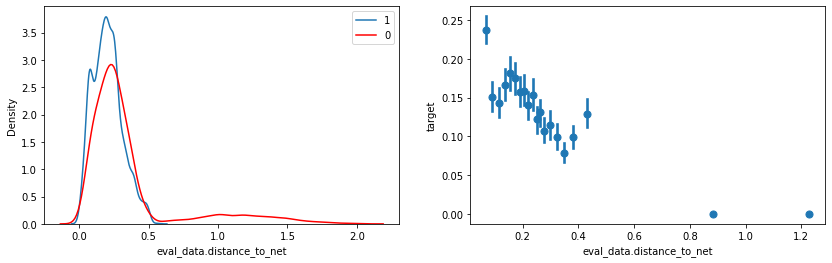

In [19]:
tmp = shots.tail(30_000)
for col in [
    "eval_data.view_of_net",
    "eval_data.distance_to_net",
#     "eval_data.dist_to_goalie",
#     "eval_data.step",
]:
    f, axes = plt.subplots(1, 2, figsize=(14, 4))
    sns.kdeplot(x=tmp[col][tmp.target == 1], label="1", ax=axes[0])
    sns.kdeplot(x=tmp[col][tmp.target == 0], label="0", color="red", ax=axes[0])
    sns.regplot(x=tmp[col], y=tmp.target, x_bins=20, ax=axes[1], fit_reg=False)
    axes[0].legend()
    plt.show()

In [20]:
models.load_lgb_models(quiet=False)

model loaded from /Users/liamkirwin/repo/cicada/models/short_pass_model.txt
model loaded from /Users/liamkirwin/repo/cicada/models/long_pass_model.txt
model loaded from /Users/liamkirwin/repo/cicada/models/handle_model.txt
model loaded from /Users/liamkirwin/repo/cicada/models/shot_model.txt


In [21]:
X = shots[models.lgb_model_specs["shot_success"]["features"].values()]

In [22]:
shots["lgb_pred"] = models.lgb_models["shot_success"].predict(X)

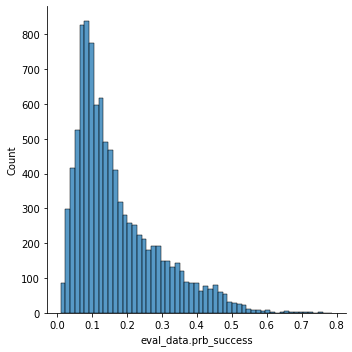

In [23]:
sns.displot(shots.tail(10_000)["eval_data.prb_success"])

### Shap

In [24]:
model = models.lgb_models["shot_success"]
model.params["objective"] = "regression"
explainer = shap.TreeExplainer(model)
X_ = X.tail(30_000)
shap_values = explainer.shap_values(X_)

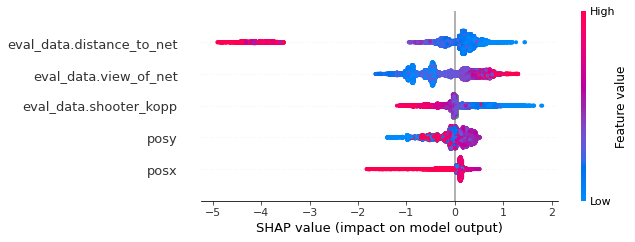

In [25]:
shap.summary_plot(shap_values, X_)

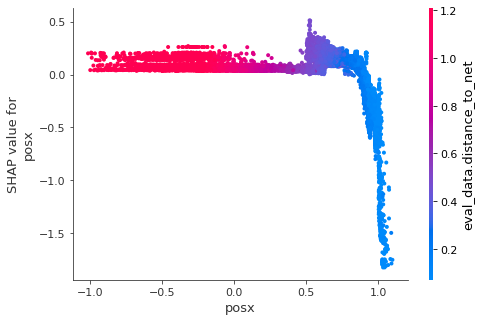

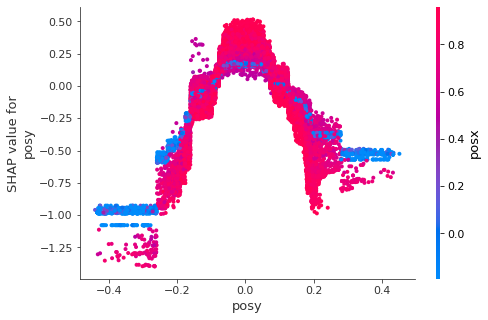

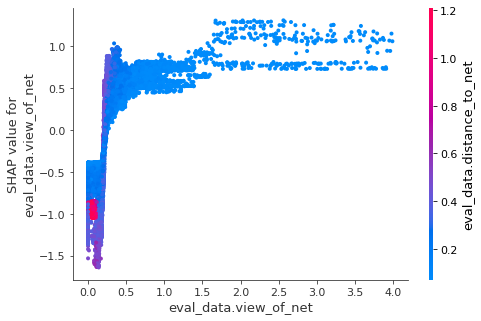

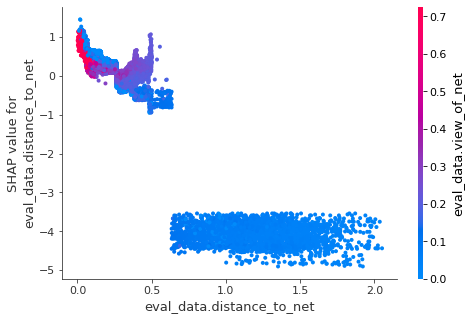

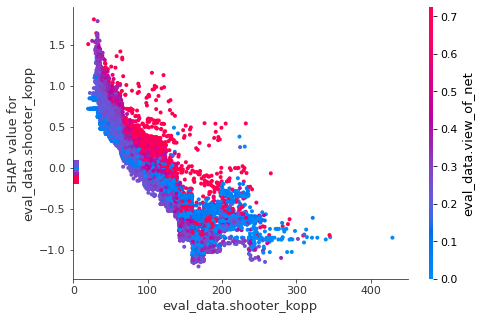

In [26]:
for col in models.lgb_model_specs["shot_success"]["features"].values():
    shap.dependence_plot(col, shap_values, X_)

## Short pass data

In [27]:
short = models.make_short_pass_dataset()
for col in models.lgb_model_specs["short_pass_success"]["features"].values():
    short[col] = short[col].astype("float32")
short.shape

100%|██████████| 23316/23316 [00:09<00:00, 2552.68it/s]


(783145, 35)

In [28]:
short.head(2)

,type,player,step,queued_at,pos_score_data.posx,pos_score_data.posy,pos_score_data.dnet,pos_score_data.view,pos_score_data.dopp,pos_score_data.kopp,pos_score_data.score,eval_data.timestep,eval_data.kick_countdown,eval_data.pass_error,eval_data.pass_error_diff,eval_data.pos_offside,eval_data.small_cone_angle,eval_data.pass_distance,eval_data.opp_dist_to_line,eval_data.opp_dist_to_active,eval_data.prb_success,target,game_id,eval_data.angle_diff,eval_data.opp_dist_to_active_now,eval_data.opp_dist_now,eval_data.angle_to_sticky,eval_data.active_vel,eval_data.player_vel,one_time_kick,eval_data.one_time_kick,eval_data.kick_hold_length,eval_data.tiny_cone_angle,eval_data.micro_cone_angle,eval_data.reverse_tiny_cone_angle
0,SHORT_PASS_ATTEMPT,9.0,18,17.0,-0.010334,0.130381,1.018712,0.00000,0.023683,87.227043,21.635699,4.0,10.0,2.590400,37.900120,0.0,4.526554,0.182050,236.365311,0.014993,0.8,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,SHORT_PASS_ATTEMPT,9.0,121,120.0,-0.022203,-0.063203,1.024155,0.06444,0.065989,43.162243,23.636419,4.0,10.0,21.458441,8.852076,0.0,7.458755,0.483853,104.708473,0.069157,0.8,1,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


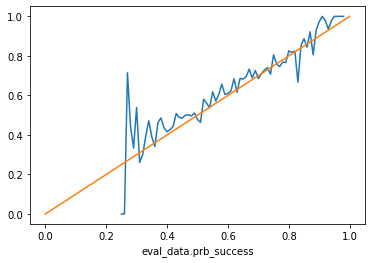

In [29]:
ax = short.tail(10_000).groupby(short["eval_data.prb_success"].round(2)).target.mean().plot()
ax.plot([0, 1], [0, 1])

In [30]:
models.load_lgb_models(quiet=False)

model loaded from /Users/liamkirwin/repo/cicada/models/short_pass_model.txt
model loaded from /Users/liamkirwin/repo/cicada/models/long_pass_model.txt
model loaded from /Users/liamkirwin/repo/cicada/models/handle_model.txt
model loaded from /Users/liamkirwin/repo/cicada/models/shot_model.txt


In [31]:
X = short[models.lgb_model_specs["short_pass_success"]["features"].values()]

In [32]:
short["lgb_pred"] = models.lgb_models["short_pass_success"].predict(X)

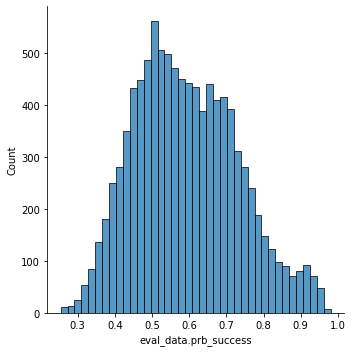

In [33]:
sns.displot(short.tail(10_000)["eval_data.prb_success"])

### Shap

In [35]:
model = models.lgb_models["short_pass_success"]
model.params["objective"] = "regression"
explainer = shap.TreeExplainer(model)
X_ = X.tail(30_000)
shap_values = explainer.shap_values(X_)

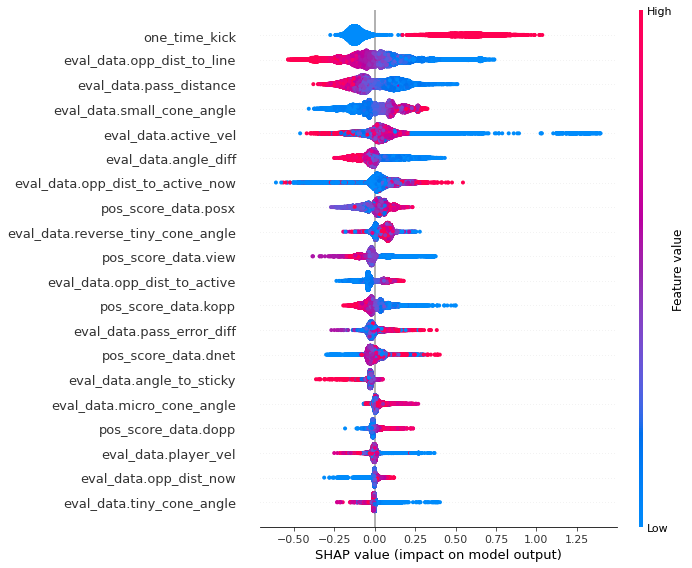

In [36]:
shap.summary_plot(shap_values, X_)

/Users/liamkirwin/.local/share/virtualenvs/cicada-PMgweW5G/lib/python3.8/site-packages/shap/plots/_scatter.py:636: MatplotlibDeprecationWarning:

Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.



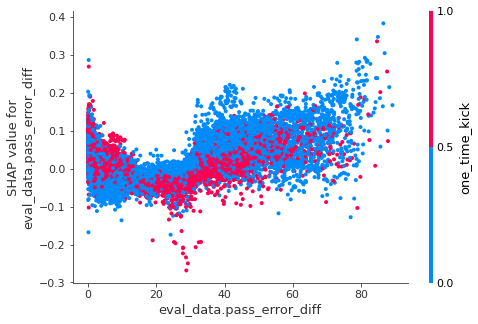

/Users/liamkirwin/.local/share/virtualenvs/cicada-PMgweW5G/lib/python3.8/site-packages/shap/plots/_scatter.py:636: MatplotlibDeprecationWarning:

Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.



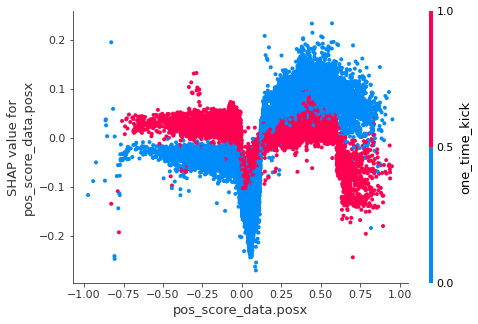

/Users/liamkirwin/.local/share/virtualenvs/cicada-PMgweW5G/lib/python3.8/site-packages/shap/plots/_scatter.py:636: MatplotlibDeprecationWarning:

Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.



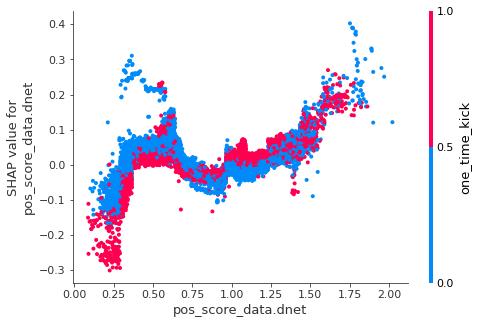

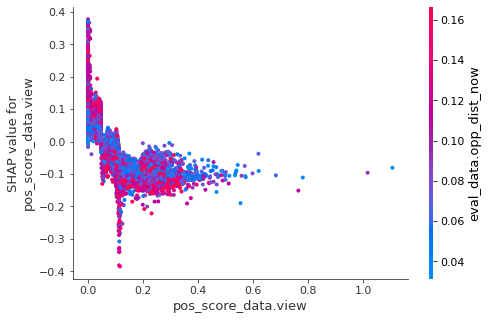

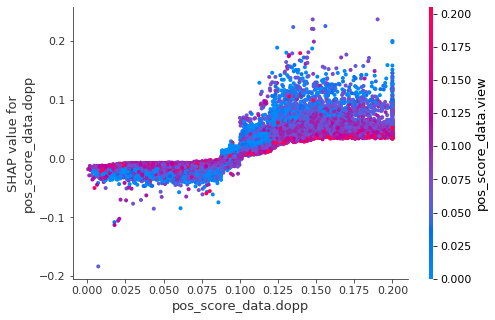

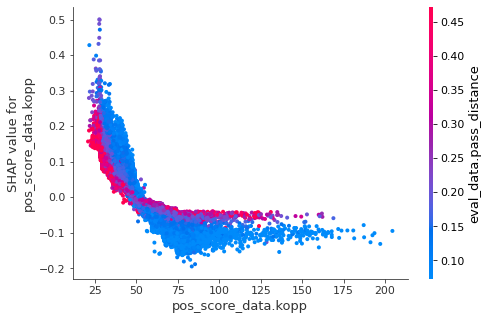

/Users/liamkirwin/.local/share/virtualenvs/cicada-PMgweW5G/lib/python3.8/site-packages/shap/plots/_scatter.py:636: MatplotlibDeprecationWarning:

Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.



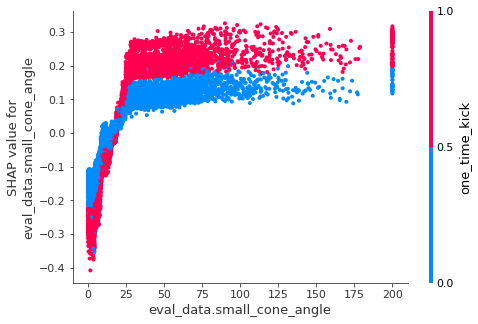

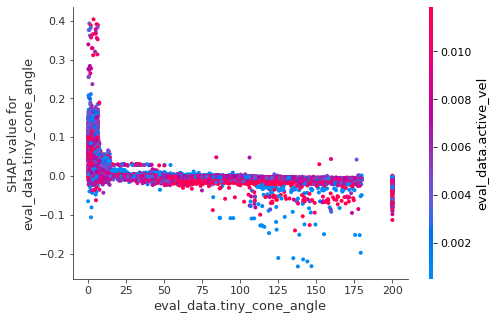

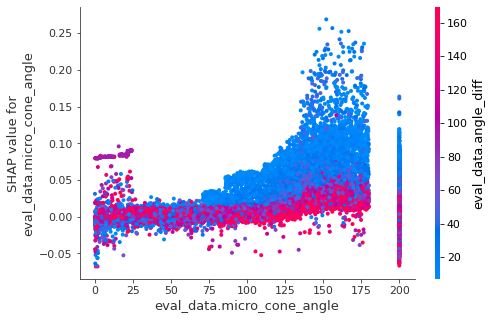

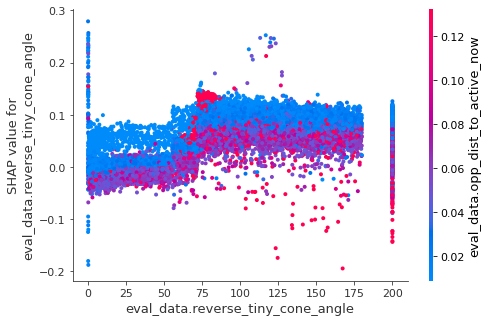

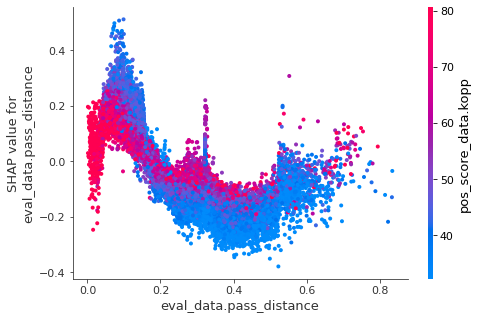

/Users/liamkirwin/.local/share/virtualenvs/cicada-PMgweW5G/lib/python3.8/site-packages/shap/plots/_scatter.py:636: MatplotlibDeprecationWarning:

Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.



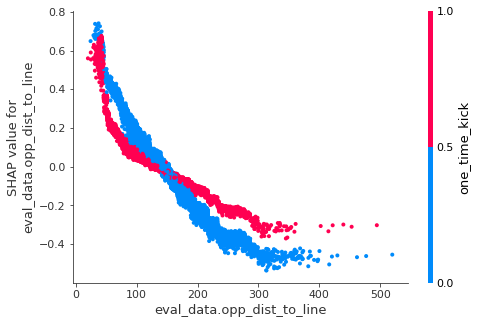

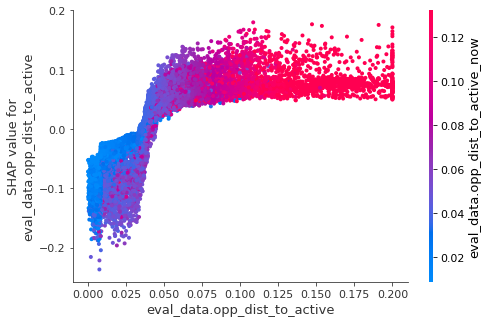

/Users/liamkirwin/.local/share/virtualenvs/cicada-PMgweW5G/lib/python3.8/site-packages/shap/plots/_scatter.py:636: MatplotlibDeprecationWarning:

Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.



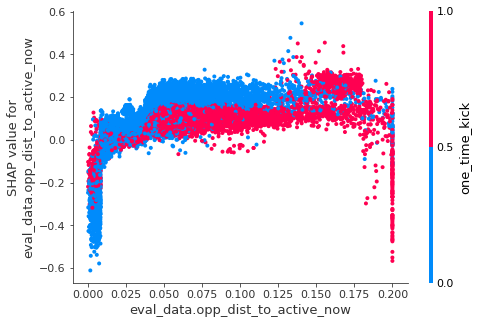

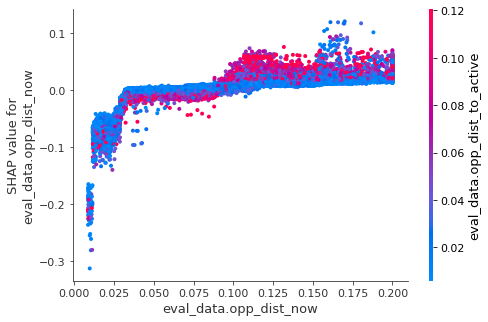

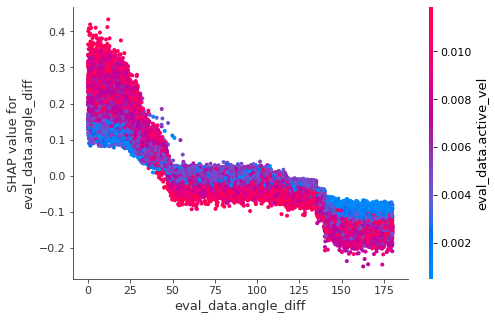

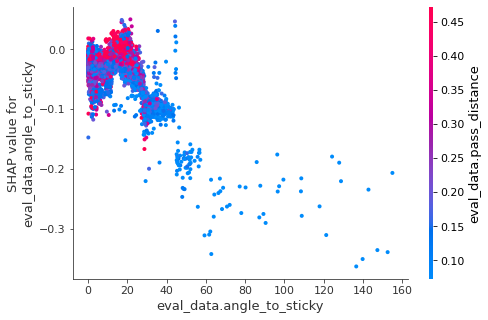

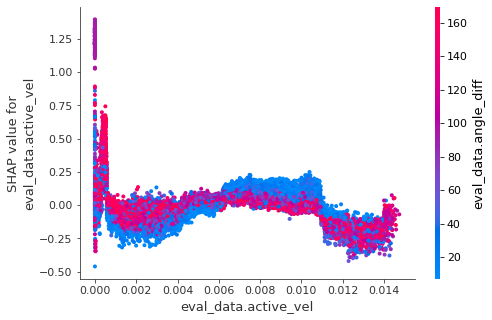

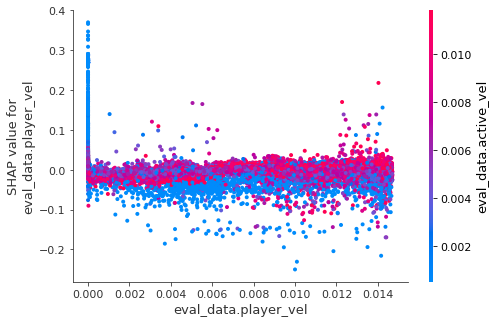

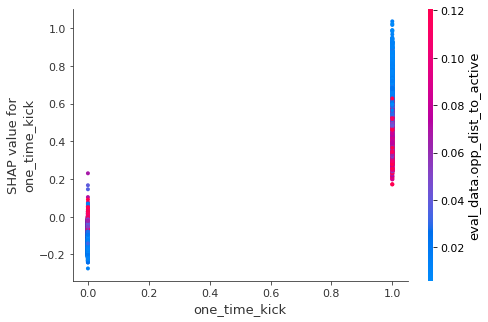

In [37]:
for col in models.lgb_model_specs["short_pass_success"]["features"].values():
    shap.dependence_plot(col, shap_values, X_)

## Long pass data

In [38]:
long = models.make_long_pass_dataset()
for col in models.lgb_model_specs["long_pass_success"]["features"].values():
    long[col] = long[col].astype("float32")
long.shape

100%|██████████| 23316/23316 [00:10<00:00, 2304.81it/s]


(677983, 36)

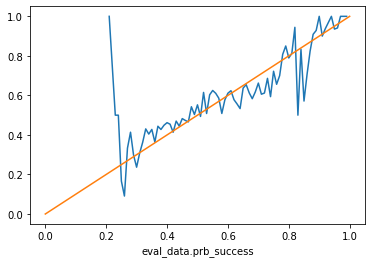

In [39]:
ax = long.tail(10_000).groupby(long["eval_data.prb_success"].round(2)).target.mean().plot()
ax.plot([0, 1], [0, 1])

In [40]:
models.load_lgb_models(quiet=False)

model loaded from /Users/liamkirwin/repo/cicada/models/short_pass_model.txt
model loaded from /Users/liamkirwin/repo/cicada/models/long_pass_model.txt
model loaded from /Users/liamkirwin/repo/cicada/models/handle_model.txt
model loaded from /Users/liamkirwin/repo/cicada/models/shot_model.txt


In [41]:
X = long[models.lgb_model_specs["long_pass_success"]["features"].values()]

In [42]:
long["lgb_pred"] = models.lgb_models["long_pass_success"].predict(X)

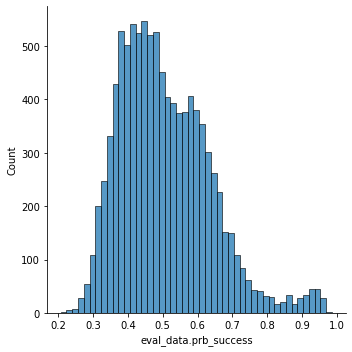

In [43]:
sns.displot(long.tail(10_000)["eval_data.prb_success"])

### Shap

In [44]:
model = models.lgb_models["long_pass_success"]
model.params["objective"] = "regression"
explainer = shap.TreeExplainer(model)
X_ = X.tail(30_000)
shap_values = explainer.shap_values(X_)

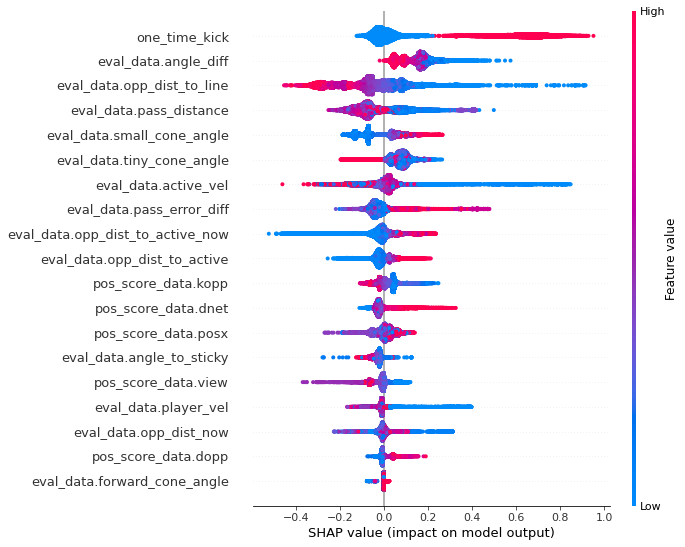

In [45]:
shap.summary_plot(shap_values, X_)

/Users/liamkirwin/.local/share/virtualenvs/cicada-PMgweW5G/lib/python3.8/site-packages/shap/plots/_scatter.py:636: MatplotlibDeprecationWarning:

Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.



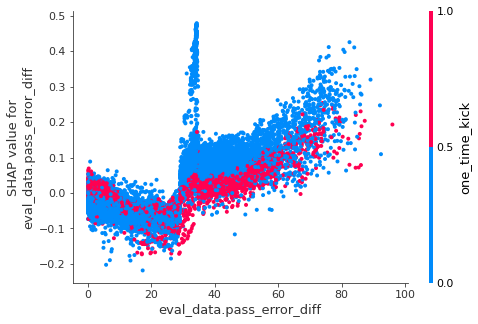

/Users/liamkirwin/.local/share/virtualenvs/cicada-PMgweW5G/lib/python3.8/site-packages/shap/plots/_scatter.py:636: MatplotlibDeprecationWarning:

Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.



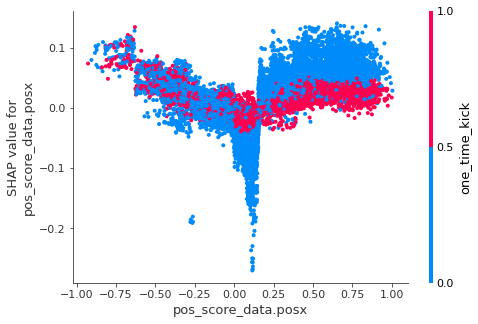

/Users/liamkirwin/.local/share/virtualenvs/cicada-PMgweW5G/lib/python3.8/site-packages/shap/plots/_scatter.py:636: MatplotlibDeprecationWarning:

Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.



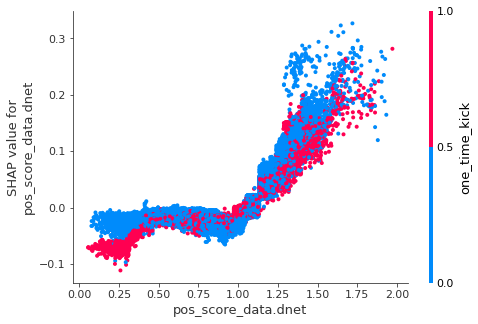

/Users/liamkirwin/.local/share/virtualenvs/cicada-PMgweW5G/lib/python3.8/site-packages/shap/plots/_scatter.py:636: MatplotlibDeprecationWarning:

Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.



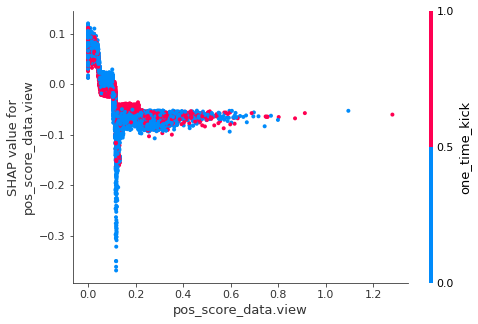

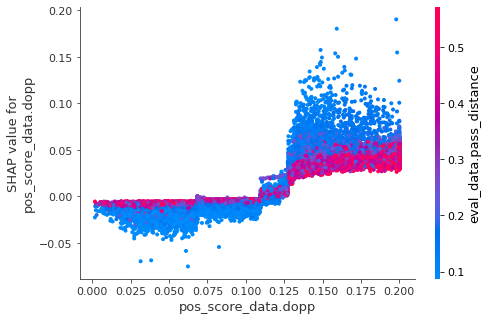

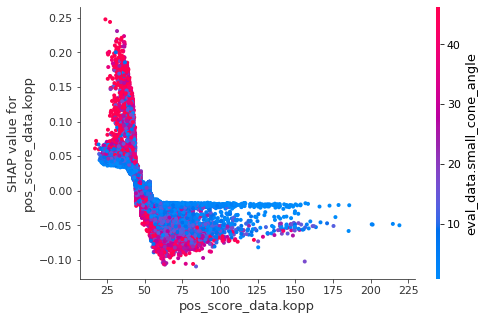

/Users/liamkirwin/.local/share/virtualenvs/cicada-PMgweW5G/lib/python3.8/site-packages/shap/plots/_scatter.py:636: MatplotlibDeprecationWarning:

Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.



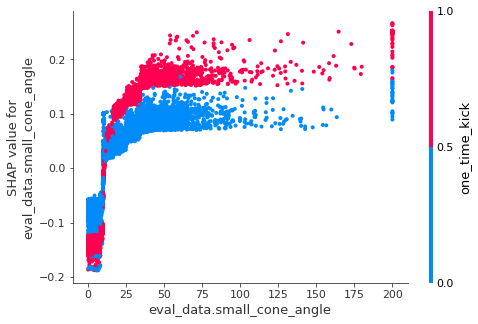

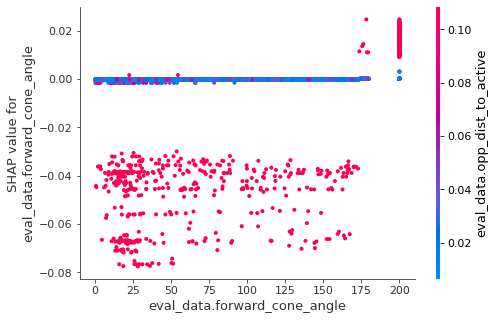

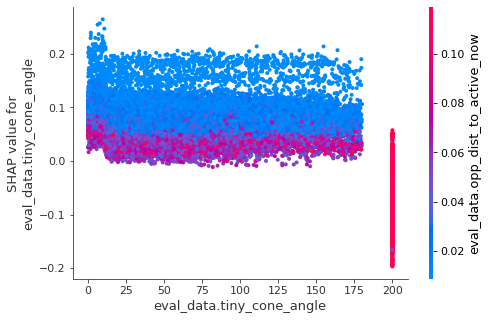

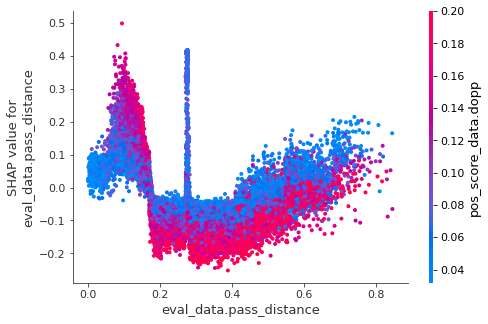

/Users/liamkirwin/.local/share/virtualenvs/cicada-PMgweW5G/lib/python3.8/site-packages/shap/plots/_scatter.py:636: MatplotlibDeprecationWarning:

Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.



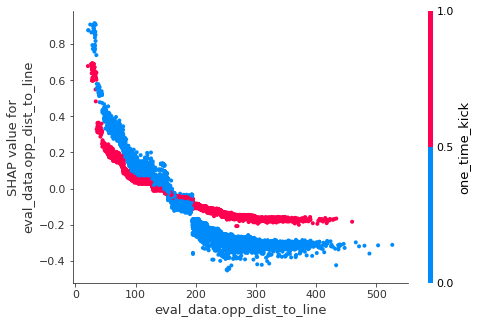

/Users/liamkirwin/.local/share/virtualenvs/cicada-PMgweW5G/lib/python3.8/site-packages/shap/plots/_scatter.py:636: MatplotlibDeprecationWarning:

Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.



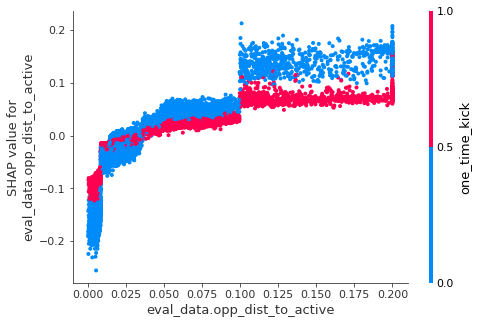

/Users/liamkirwin/.local/share/virtualenvs/cicada-PMgweW5G/lib/python3.8/site-packages/shap/plots/_scatter.py:636: MatplotlibDeprecationWarning:

Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.



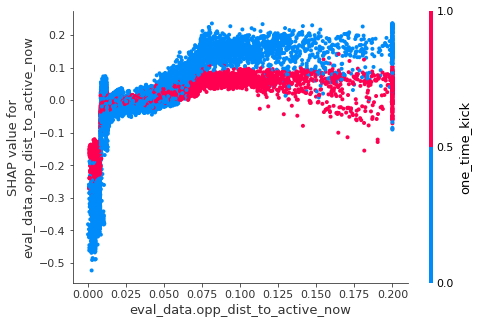

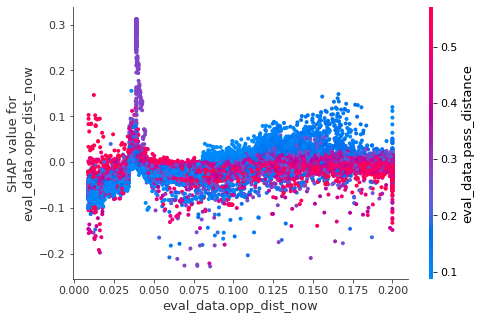

/Users/liamkirwin/.local/share/virtualenvs/cicada-PMgweW5G/lib/python3.8/site-packages/shap/plots/_scatter.py:636: MatplotlibDeprecationWarning:

Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.



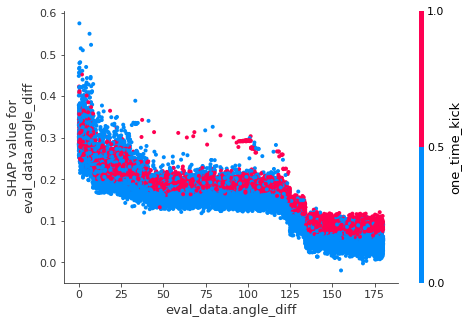

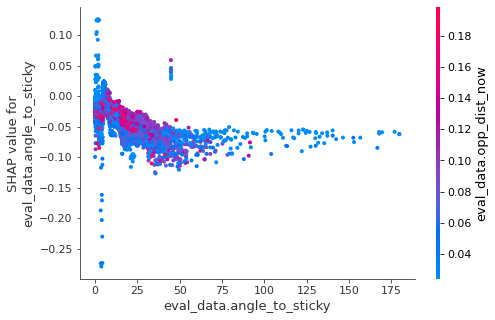

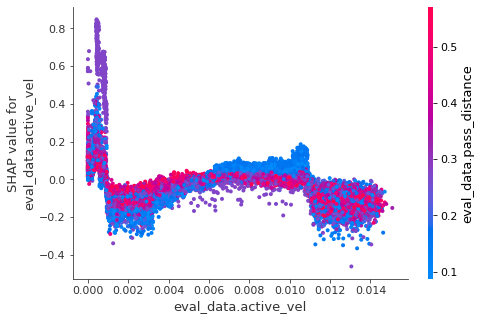

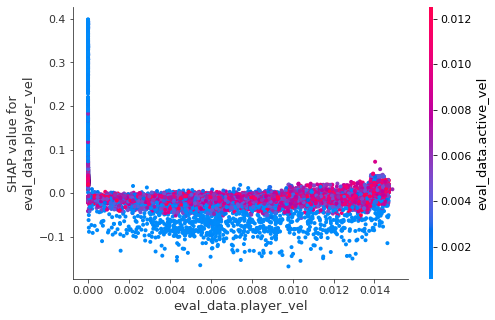

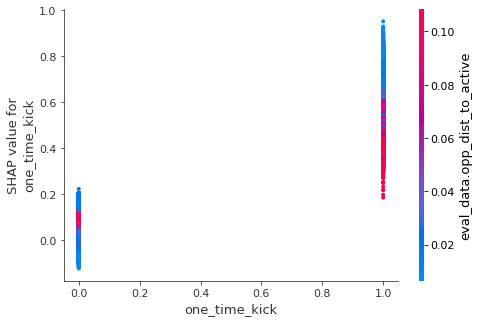

In [46]:
for col in models.lgb_model_specs["long_pass_success"]["features"].values():
    shap.dependence_plot(col, shap_values, X_)

## Handling data

In [47]:
handle = models.make_handle_dataset(incremental=True)
for col in models.lgb_model_specs["handle_success"]["features"].values():
    handle[col] = handle[col].astype("float32")
handle.shape

100%|██████████| 23316/23316 [00:10<00:00, 2240.37it/s]


(10000000, 23)

In [48]:
handle.tail()

,type,step,pos_score_data.posx,pos_score_data.posy,pos_score_data.dnet,pos_score_data.view,pos_score_data.dopp,pos_score_data.kopp,pos_score_data.score,eval_data.timestep,eval_data.close_opp_dir_change,eval_data.small_cone_angle,eval_data.outside_pitch,eval_data.angle_diff,eval_data.prb_success,target,game_id,eval_data.angle_to_sticky,eval_data.opp_dist_to_active,eval_data.opp_dist_to_active_now,eval_data.active_vel,eval_data.relative_distance,eval_data.micro_cone_angle
9999995,MOVE_WITH_BALL_ATTEMPT,2992,0.733014,0.173361,0.318332,0.189515,0.015656,105.021368,31.047417,6.0,0.004423,67.576256,0.0,17.682766,0.974217,1,23295,23.217438,0.030774,0.104735,0.012979,0.013139,30.579737
9999996,MOVE_WITH_BALL_ATTEMPT,2993,0.748008,0.172605,0.305438,0.194093,0.016038,103.460247,31.444678,6.0,0.004425,67.336655,0.0,17.455954,0.971976,1,23295,23.744186,0.030179,0.105469,0.013423,0.012252,32.036449
9999997,MOVE_WITH_BALL_ATTEMPT,2994,0.761444,0.171242,0.293654,0.198586,0.015211,106.354275,31.851993,6.0,0.004417,66.377739,0.0,17.381359,0.971349,1,23295,23.752584,0.029704,0.103888,0.013483,0.011112,30.732891
9999998,MOVE_WITH_BALL_ATTEMPT,2995,0.772956,0.167952,0.282412,0.204922,0.027910,76.570789,32.403456,6.0,0.004322,64.463058,0.0,16.996803,0.985965,1,23295,22.733505,0.022174,0.099502,0.013220,0.009515,70.433784
9999999,MOVE_WITH_BALL_ATTEMPT,2996,0.781571,0.160945,0.271320,0.214945,0.048569,61.682558,33.251948,6.0,0.003925,62.691605,0.0,14.765755,0.994742,1,23295,18.464811,0.029997,0.091682,0.012427,0.008607,129.809189


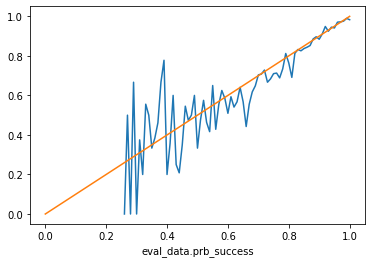

In [49]:
ax = handle.tail(10_000).groupby(handle["eval_data.prb_success"].round(2)).target.mean().plot()
ax.plot([0, 1], [0, 1])

In [50]:
models.load_lgb_models(quiet=False)

model loaded from /Users/liamkirwin/repo/cicada/models/short_pass_model.txt
model loaded from /Users/liamkirwin/repo/cicada/models/long_pass_model.txt
model loaded from /Users/liamkirwin/repo/cicada/models/handle_model.txt
model loaded from /Users/liamkirwin/repo/cicada/models/shot_model.txt


In [51]:
X = handle[models.lgb_model_specs["handle_success"]["features"].values()]

In [52]:
handle["lgb_pred"] = models.lgb_models["handle_success"].predict(X)

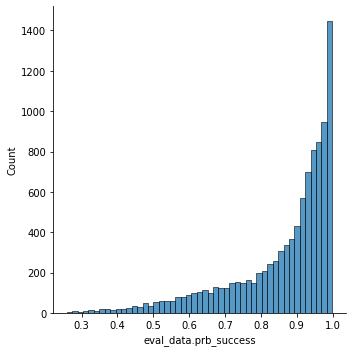

In [53]:
sns.displot(handle.tail(10_000)["eval_data.prb_success"])

### Shap

In [54]:
model = models.lgb_models["handle_success"]
model.params["objective"] = "regression"
explainer = shap.TreeExplainer(model)
X_ = X.tail(30_000)
shap_values = explainer.shap_values(X_)

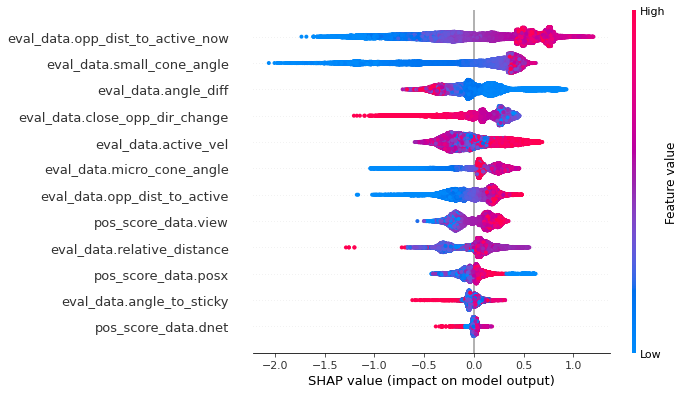

In [55]:
shap.summary_plot(shap_values, X_)

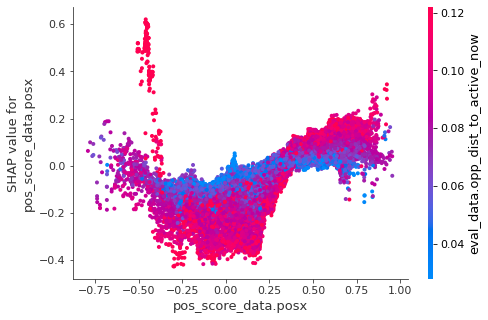

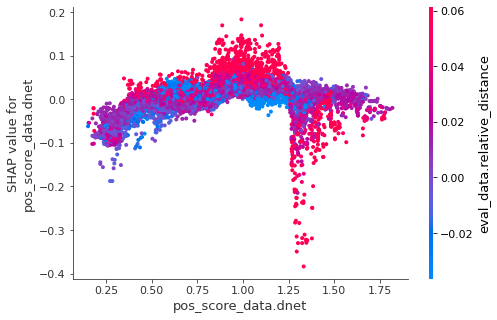

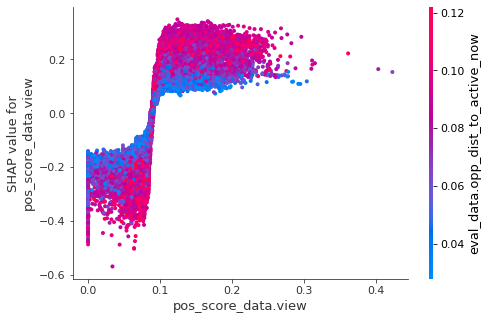

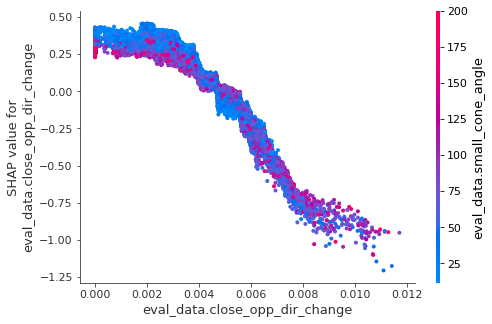

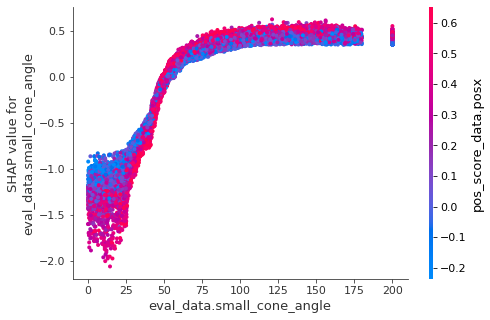

...

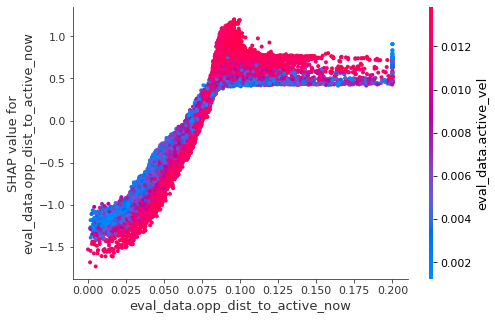

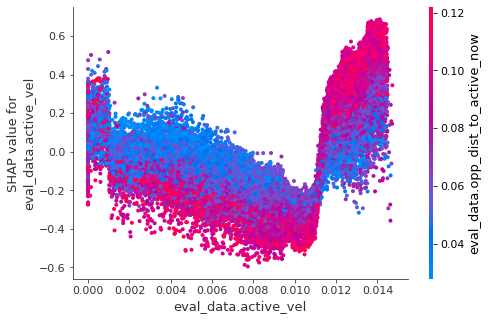

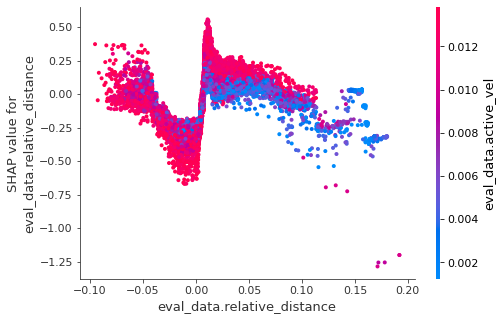

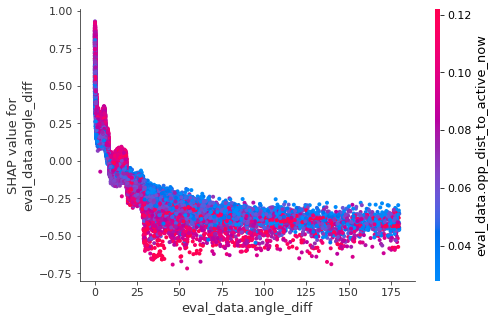

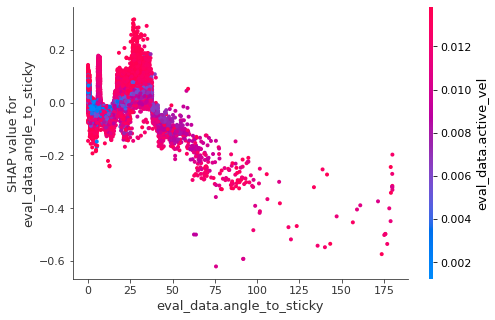

In [56]:
for col in models.lgb_model_specs["handle_success"]["features"].values():
    shap.dependence_plot(col, shap_values, X_)

## Position score data

In [57]:
pos_score = models.make_position_score_dataset(incremental=True)
pos_score.shape

100%|██████████| 23316/23316 [00:26<00:00, 893.89it/s] 


truncating dataset longer than 10000000 rows
dropping column player because all values are nan


(10000000, 11)

In [58]:
pos_score.head()

,type,step,posx,posy,dnet,view,dopp,kopp,score,reward,game_id
151504,ACTIVE_POS_SCORE,2703,0.672470,-0.010066,0.327685,0.186005,0.057244,59.188367,44.933018,-0.025,9097
151505,ACTIVE_POS_SCORE,2704,0.685763,-0.010157,0.314401,0.182767,0.056320,59.798651,44.985230,-0.025,9097
151506,ACTIVE_POS_SCORE,2705,0.696592,-0.010724,0.303597,0.175162,0.052906,61.358017,44.755469,-0.025,9097
151507,ACTIVE_POS_SCORE,2706,0.707225,-0.010762,0.292973,0.162627,0.049308,63.011820,43.918807,-0.025,9097
151508,ACTIVE_POS_SCORE,2707,0.716738,-0.010741,0.283466,0.142896,0.044589,65.819505,43.299743,-0.025,9097


In [59]:
mask = pos_score.game_id >= 12_000
pos_score = pos_score[mask].copy()
pos_score.shape

(7808829, 11)

In [60]:
pos_score["pred"] = np.random.uniform(size=len(pos_score))

In [61]:
pos_score["v4_dnet"] = pos_score["dnet"]
pos_score["v4_posy"] = pos_score["posy"].abs()
pos_score["v4_dnet_posy"] = pos_score["dnet"] * pos_score["posy"].abs()
pos_score["v4_view"] = pos_score["view"]
pos_score["v4_view2"] = pos_score["view"] ** 2
pos_score["v4_view3"] = pos_score["view"] ** 3

In [62]:
X_cols = [
    "v4_dnet",
    "v4_posy",
    "v4_dnet_posy",
    "v4_view",
    "v4_view2",
    "v4_view3",
]

In [63]:
from IPython.display import clear_output, display
from ipywidgets import Output

In [64]:
mean_pred = [np.nan]
median_pred = [np.nan]
std_pred = [np.nan]
param_update = [np.nan]
last_params = None

out = Output()
display(out)

for _ in tqdm(range(200)):
    
    out.clear_output(wait=True)
    
    pos_score["target"] = (pos_score.reward * 50.0 + pos_score.pred.shift(-1) * 0.98).clip(lower=0.0, upper=50.0)
    pos_score.loc[pos_score.game_id != pos_score.game_id.shift(1), "target"] = np.nan
    X = sm.add_constant(pos_score[X_cols])
    mask = pos_score.target.notna()
    ols_model = sm.OLS(pos_score.target[mask], X[mask], missing="drop").fit()
    pos_score["pred"] = ols_model.predict(X)
    
    mean_pred.append(pos_score.pred.mean())
    median_pred.append(pos_score.pred.median())
    std_pred.append(pos_score.pred.std())
    if last_params is not None:
        update_size = (ols_model.params - last_params).abs().sum()
    else:
        update_size = ols_model.params.abs().sum()
    param_update.append(update_size)
    last_params = ols_model.params.copy()
    
    f, axes = plt.subplots(1, 4, figsize=(14, 3))
    pd.Series(mean_pred).plot(ax=axes[0], title="mean")
    pd.Series(median_pred).plot(ax=axes[1], title="median")
    pd.Series(std_pred).plot(ax=axes[2], title="std")
    ax = pd.Series(param_update).plot(ax=axes[3], title="param_update")
    ax.set_yscale("log")
    
    with out:
        plt.show()

Output()

In [65]:
ols_model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                 target   R-squared:                       0.841
Model:                            OLS   Adj. R-squared:                  0.841
Method:                 Least Squares   F-statistic:                 6.884e+06
Date:                Thu, 03 Dec 2020   Prob (F-statistic):               0.00
Time:                        14:28:36   Log-Likelihood:            -2.1717e+07
No. Observations:             7797560   AIC:                         4.343e+07
Df Residuals:                 7797553   BIC:                         4.343e+07
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
================================================================================
                   coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------
const           41.8482      0.008   5331.762      0.000      41.833      41.864
v4_dnet        -26.8642      0.007  -3586.920      0.000     -26.879     -26.849
v4_posy        -80.4176      0.031  -2586.770      0.000     -80.478     -80.357
v4_dnet_posy    60.4862      0.031   1924.390      0.000      60.425      60.548
v4_view         48.9472      0.038   1295.251      0.000      48.873      49.021
v4_view2       -61.4110      0.086   -711.633      0.000     -61.580     -61.242
v4_view3        13.0704      0.025    531.987      0.000      13.022      13.119
==============================================================================
Omnibus:                  4294054.274   Durbin-Watson:                   1.022
Prob(Omnibus):                  0.000   Jarque-Bera (JB):        163803076.269
Skew:                           2.022   Prob(JB):                         0.00
Kurtosis:                      25.086   Cond. No.                         89.8
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [66]:
params = ols_model.params.tolist()
print(params[0])
for p in params[1:]:
    print("+", p)

41.84820886388043
+ -26.864159750978224
+ -80.41756177657443
+ 60.48618164477316
+ 48.94715852645761
+ -61.41104707153468
+ 13.07044554108357


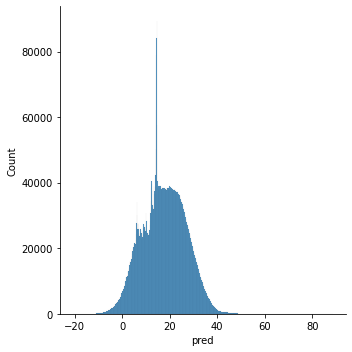

In [67]:
sns.displot(pos_score.pred)

v4_dnet


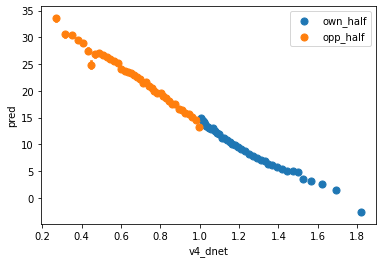

v4_posy


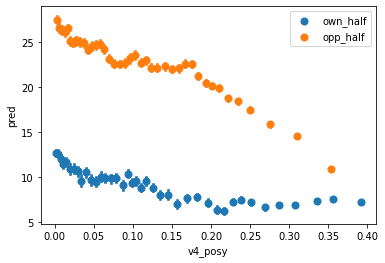

v4_dnet_posy


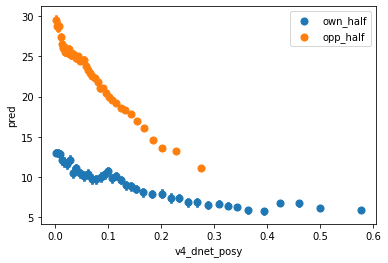

v4_view


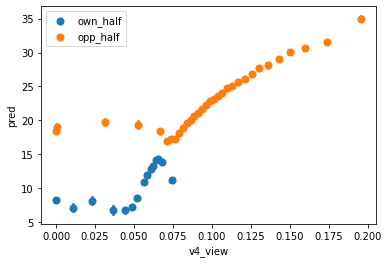

v4_view2


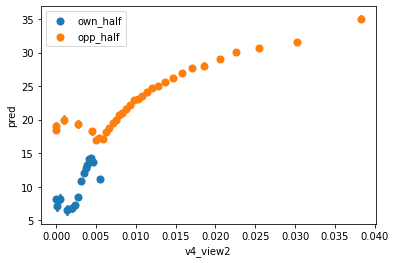

v4_view3


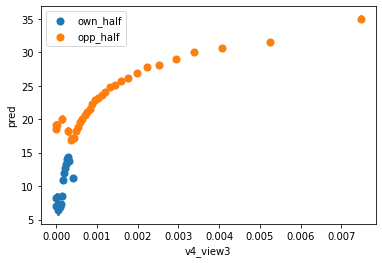

In [68]:
tmp = pos_score.tail(50_000)
for col in X_cols: 
    print(col)
    tmp_a, tmp_b = tmp[tmp.posx <= 0], tmp[tmp.posx > 0]
    sns.regplot(x=tmp_a[col], y=tmp_a.pred, x_bins=40, fit_reg=False, label="own_half")
    sns.regplot(x=tmp_b[col], y=tmp_b.pred, x_bins=40, fit_reg=False, label="opp_half")
    plt.legend()
    plt.show()

<AxesSubplot:xlabel='posx', ylabel='posy'>

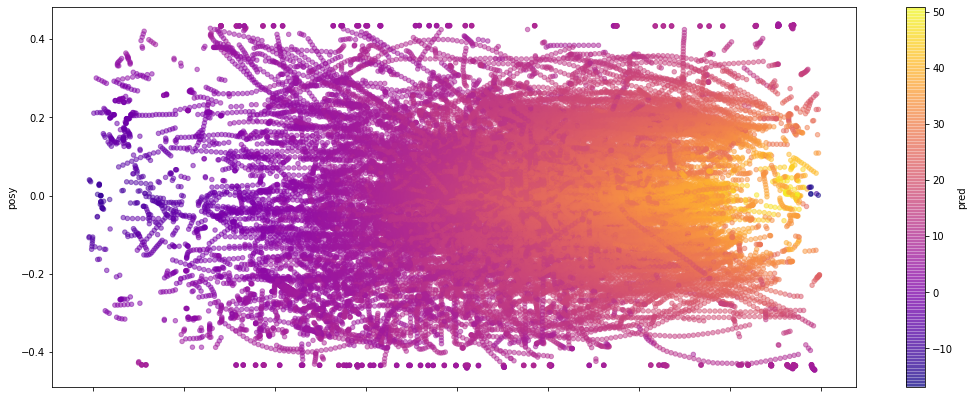

In [69]:
tmp = pos_score.tail(50_000)
tmp.plot.scatter(x="posx", y="posy", c="pred", figsize=(18, 7), colormap="plasma", alpha=0.5)

<AxesSubplot:xlabel='posx', ylabel='posy'>

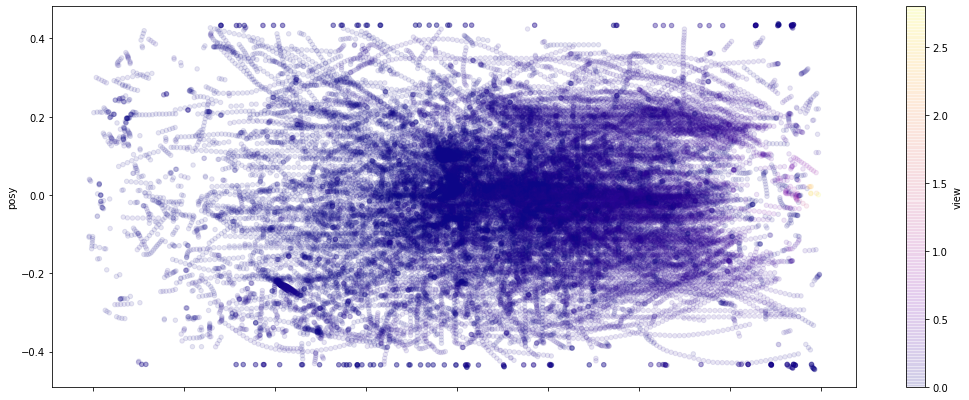

In [70]:
tmp = pos_score.tail(50_000)
tmp.plot.scatter(x="posx", y="posy", c="view", figsize=(18, 7), colormap="plasma", alpha=0.1)

/Users/liamkirwin/.local/share/virtualenvs/cicada-PMgweW5G/lib/python3.8/site-packages/seaborn/distributions.py:2551: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



<AxesSubplot:xlabel='view', ylabel='Density'>

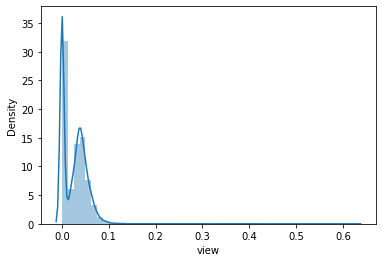

In [71]:
sns.distplot(pos_score.view.sample(10_000).apply(lambda x: np.log10(x + 1)))